## Test_Baseline_Code:  Scene Classification

### B.  Dataset Description

Dataset: https://www.kaggle.com/datasets/nitishabharathi/scene-classification?resource=download&select=train-scene+classification

This dataset contains about ~25k images from a wide range of natural scenes from all around the world. The task is to identify which kind of scene can the image be categorized into.

It is a 6 class problem

 1. Buildings
 2. Forests
 3. Mountains
 4. Glacier
 5. Street
 6. Sea


### C. Solution/ Approach Description
#### C1.  Imports

In [1]:
# standard
import cupy as cp
import cudf as cd
import csv
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import pandas as pd
import plotly.express as px
import plotly.io as pio
import seaborn as sns

from cuml.decomposition import IncrementalPCA
from cuml.ensemble import RandomForestClassifier as cuRFC
from cuml.linear_model import LogisticRegression
from cuml.manifold import TSNE
from cuml.manifold.umap import UMAP as cuUMAP
from cuml.model_selection import train_test_split
from cuml.neighbors import KNeighborsClassifier
from cuml.svm import LinearSVC
from cuml.svm import SVC
from itertools import compress
from matplotlib.colors import ListedColormap
from PIL import Image

#### C2. Configurations, Data Load, Global Variables

In [2]:
# file read
img_path = "./train_scene_classification/train/"             # get image file path
df = pd.read_csv("./train_scene_classification/train.csv")   # read label csv

# label_id to name
# the labels have been rearranged from the order it is described in kaggle 
# to how labels correspond to images in train.csv
label_name = ['buildings','forests','glacier','mountains','sea','street']

# var counts
class_count = len(label_name)                                # class count: refer to Kaggle class descriptions
img_count = len(os.listdir(img_path))                        # number of images in img_path
lbl_count = len(df)                                          # number of labels in train.csv 

print("Check var_counts:")
print("class_count:", class_count)
print("img_count:", img_count)
print("lbl_count:", lbl_count)

Check var_counts:
class_count: 6
img_count: 24335
lbl_count: 17034


#### C3.  Exploratory Analysis

Not all images conform to shape (150,150,3).  There are two ways to remedy this-- we can omit from our final sampling the non-conforming images, or apply padding to make all images uniform in shape. This can be done by setting **"pad_img_var"** below to either **True** or **False**.  Since not all images have labels (see var_counts) and not all labels will be part of the final training/testing sets anyway, then setting **pad_img_arr** to **False** seems more practical.

In [3]:
current_path = os.getcwd() + "/train_scene_classification/train/"
image_list = os.listdir(current_path)
image_list
filename = os.getcwd() + "/train_scene_classification/train.csv"

with open(filename) as f:
    next(f)  # Skip the header
    reader = csv.reader(f, skipinitialspace=True)
    dictionary_result = dict(reader)

Because we know the size of the images, we can now loop through all of the images, load them into a list and load the labels into a separate list. This list is then loaded into a matrix on the GPU. 

In [4]:
matrix_cols = int(150 * 150 * 3)

images = []
labels = []

for key, value in dictionary_result.items():
    image = Image.open(current_path + key)
    data = np.asarray(image).flatten()
    if len(data) == matrix_cols:
        images.append(data)
        labels.append(int(value))
        
all_images_cupy = cp.array(images, dtype = 'float16')

A dictionary will allow us to move between the numeric labels and human-readable labels. 

In [5]:
ordered_names = ['Building','Sea','Street','Forest','Glacier','Mountain']

names = ['Building','Forest','Glacier','Mountain','Sea','Street']
names_dict = dict(zip(list(range(6)), names))
inv_names_dict = dict(zip(names, list(range(6))))

label_array = np.array([names_dict.get(item) for item in labels])

A histogram of the total number of counts in each image category will allow us to see if the dataset is balanced. The colours of each column are manually assigned to match the standard plotly colour scheme. 

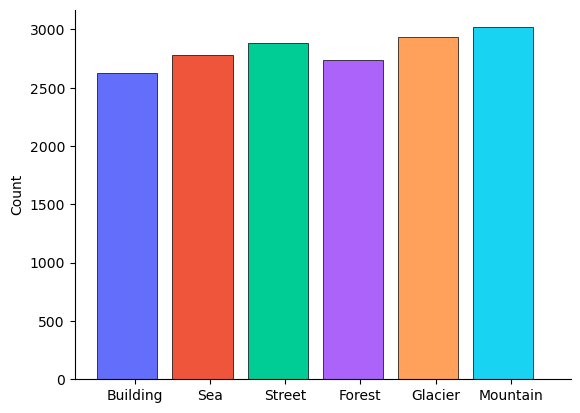

In [6]:
c_palette = px.colors.qualitative.Plotly[:6] # Use standard plotly colours to match 3D visualizations.

ax = sns.histplot(label_array, linewidth = 0.5, alpha = 0.5)
for i in range(6):
    ax.patches[i].set_facecolor(c_palette[i])
    ax.patches[i].set_width(0.8)
    sns.despine()

The total distribution of counts is approxiamtely balanced, so we should expect a baseline estimation accuracy of approximately 17%.

Generate 'averages' for each image. This is done by averaging the colours for each pixel in all similarly labelled images, then reconstucting the average into a single image that represents all of the input training data. 

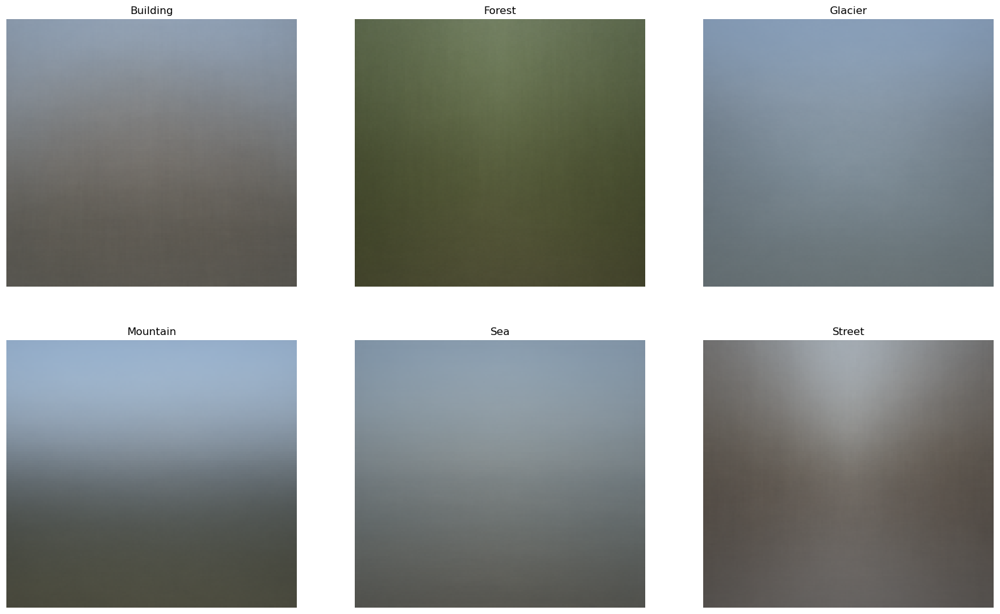

In [7]:
fig, axs = plt.subplots(2, 3, sharey=True, figsize = (20,12))

subplot_list = []
for i in range(3):
    for j in range(3):
        subplot_list.append((i,j))

k = 0
for item in set(labels):
    a = [item] * len(images)
    b = [elem in a for elem in labels]
    filtered_images = np.asarray(list(compress(images, b)))
    average_image = np.rint(filtered_images.mean(axis = 0)).reshape((150,150,3)).astype(int)
    axs[subplot_list[k]].imshow(average_image, interpolation='nearest', aspect = 'auto')
    axs[subplot_list[k]].title.set_text(names_dict.get(item))
    axs[subplot_list[k]].axis('off')
    k += 1

The next plots show the variance per pixel, for each rgb layer of the image classes. 

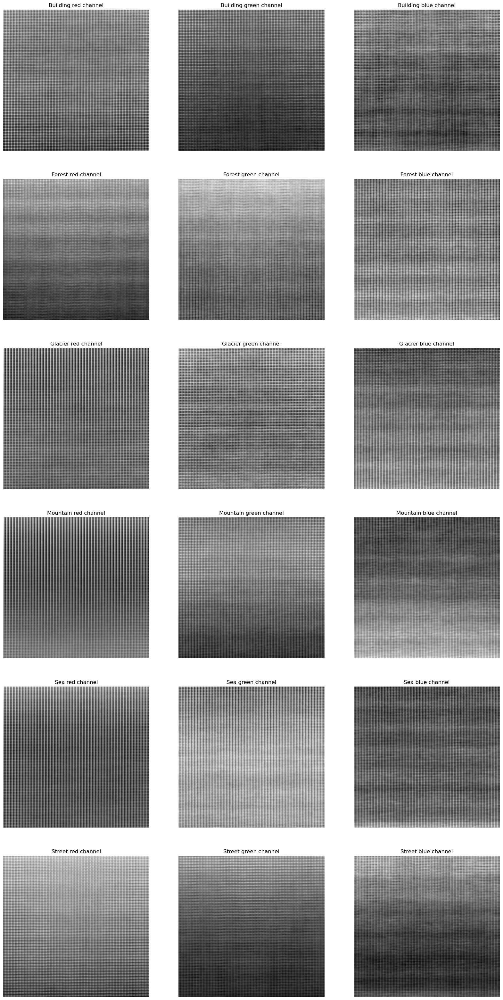

In [8]:
fig, axs = plt.subplots(6, 3, sharey=True, figsize = (20,40))
color_dict = {0:"red channel", 1:"green channel", 2:"blue channel"}

j = 0
for item in set(labels):
    a = [item] * len(images)
    b = [elem in a for elem in labels]
    filtered_images = np.asarray(list(compress(images, b)))
    for i in range(3):
        start = i * 150 * 150
        end = (i+1) * 150 * 150
        average_image = np.rint(filtered_images[:, start:end].var(axis = 0)).reshape((150,150)).astype(int)
        axs[j,i].imshow(average_image, interpolation='gaussian', aspect = 'auto', cmap='gray')
        axs[j,i].title.set_text(names_dict.get(item) + " " + color_dict.get(i))
        axs[j,i].axis('off')
 
    j += 1
    
plt.show()

### Helper functions

In [9]:
# Function that takes a model and data and returns a list of model accuracies.
def model_test(model, X_test, y_test, names_list, names_dict, print_output):
    # model - Input model type (uses either scikit learn or rapids API)
    # X_test - Test data set as an (n x m) numpy array
    # y_test - Test labels as 1D numpy array
    # names_list - List of human readable image class names
    # names_dict - Dictionary to move between integer image class labels to string names.-
    # print_output - Boolean flag to turn on screen print for accuracies. 
    accuracies = []
    y_pred = model.predict(X_test)
    correct_classification = y_pred == y_test
    accuracy = (correct_classification.get().sum()/int(len(correct_classification.get())))
    if print_output == True : print("Overall prediction accuracy for", type(model).__name__,"=", accuracy)
    accuracies.append(["Overall", accuracy])
    
    for image_type in names_list: # Loop through all image types. 
        filter_type = y_test == names_dict.get(image_type)
        filter_y_test = np.array(list(compress(y_test.tolist(), filter_type)))
        filter_y_pred = np.array(list(compress(y_pred.tolist(), filter_type)))
        correct_classification = filter_y_pred == filter_y_test
        accuracy = (correct_classification.sum()/len(correct_classification))
        if print_output == True : print(type(model).__name__, "prediction accuracy for", image_type,"images only", "=", accuracy)
        accuracies.append([image_type, accuracy])
    
    # Clean up all GPU memory items before continuing. 
    y_pred = None
    correct_classification = None
    filter_type = None
    cp._default_memory_pool.free_all_blocks()
    
    return accuracies

In [10]:
# Crate 2D colourmap for given mode predictions.
def colormap2D(model, data): 
    # model - Input model type (uses either scikit learn or rapids API)
    # embedding - Model output (either numpy or cupy array)
    
    x_min = min(data[:,0])
    x_max = max(data[:,0])
    y_min = min(data[:,1])
    y_max = max(data[:,1])
    h = 0.1
    
    xx, yy = cp.meshgrid(cp.arange(x_min, x_max, h), cp.arange(y_min, y_max, h))
    pred_positions = cp.vstack([xx.ravel(), yy.ravel()]).T
    label_np = cp.asarray(labels, dtype = 'float32')
                 
    z = model.predict(pred_positions)
    Z = np.float32(z.get())
    Z = np.fliplr(np.flipud(Z.reshape((xx.shape[0], xx.shape[1]), order = 'C'))) # Need to flip the predicted values around into meshgrid format.
    plotly_cmap = ListedColormap(c_palette)
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7, 6))
    cmesh = plt.pcolormesh(Z, cmap=plotly_cmap, rasterized=True)
    cbar = fig.colorbar(mappable=cmesh, ax=ax)
    cbar.set_ticklabels(ordered_names)
    ax.axis('off')
               
     # Clean up all GPU memory items before continuing.
    xx = None
    yy = None
    pred_positions = None
    label_np = None
    z = None
    cp._default_memory_pool.free_all_blocks()

### Embeddings

#### UMAP

Generate a 10 dimensional UMAP embedding of the image data, and plot a representation of the the data using the first 3 embeddings. 

In [11]:
reducer = cuUMAP(
    n_neighbors=20,
    n_components=10,
    n_epochs=500,
    min_dist=0.01,
    random_state = 9
)
embedding = reducer.fit_transform(all_images_cupy)

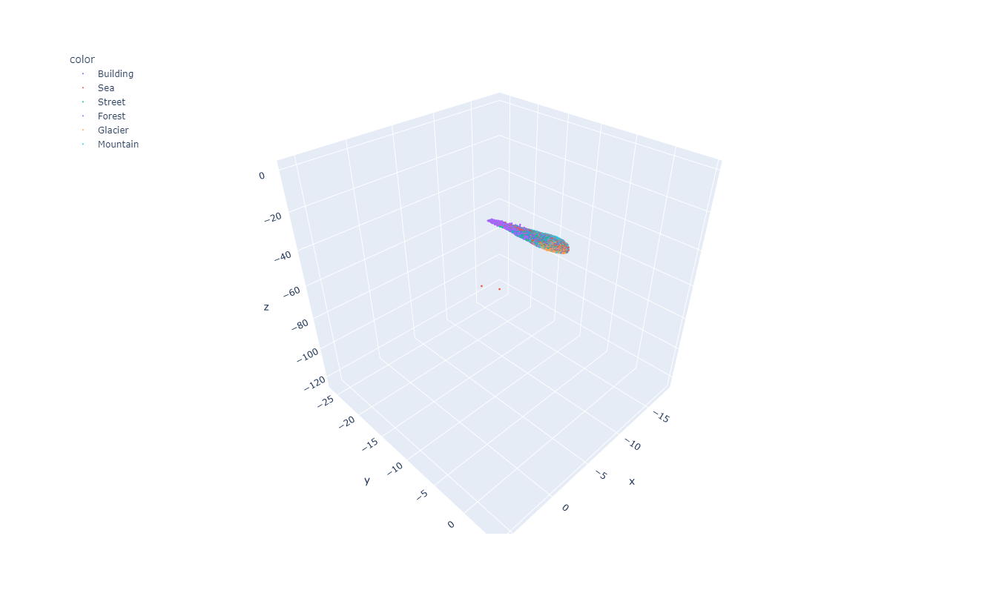

In [12]:
fig = px.scatter_3d(x=np.float32(embedding[:,0].get()), y=np.float32(embedding[:,1].get()), z=np.float32(embedding[:,2].get()), color=label_array, width=1000, height=800)
fig.update_traces(marker_size = 1.5)

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

fig.show()

In [13]:
pio.write_html(fig, file = 'UMAP', auto_open=True) # Write the file to HTML to upload onto webpage.
reducer = None # Clean up UMAP transformer from memory.
cp._default_memory_pool.free_all_blocks()

Next, we'll split the data into training and testing sets, and evaluate the accuracies for logistic regression, random forest and support vector machine models. 

In [14]:
X_train, X_test, y_train, y_test = train_test_split(embedding, cp.asarray(labels, dtype = 'int8'), train_size=0.8)
all_UMAP_models = []

The following cells loop through training classifiers, predicting on the test set, calculating accuracy, then clearing the GPU objects from memory. 

In [15]:
# Train logistic regression classifier then predict on test set. 
reg = LogisticRegression(output_type= 'cupy')
reg.fit(X_train, y_train)
all_UMAP_models.append(((type(reg).__name__, model_test(reg, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))

In [16]:
# Clean memory for next step. 
reg = None
cp._default_memory_pool.free_all_blocks()

In [17]:
# Train random forest classifier then predict on test set. 
rfr = cuRFC(n_estimators = 1000, split_criterion = 'gini', bootstrap = True, max_depth = 128, n_bins = 256)
rfr.fit(X_train, y_train)
all_UMAP_models.append(((type(rfr).__name__, model_test(rfr, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))

In [18]:
# Clean memory for next step. 
rfr = None
cp._default_memory_pool.free_all_blocks()

In [19]:
# Train SVM classifier then predict on test set. 
clf = SVC(kernel='rbf', degree=6, gamma='scale', C=100, cache_size = 8192, multiclass_strategy = 'ovo')
clf.fit(X_train, y_train)
all_UMAP_models.append(((type(clf).__name__, model_test(clf, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))

In [20]:
# Clean memory for next step. 
clf = None
cp._default_memory_pool.free_all_blocks()

In [21]:
# Manipulating list of classification reuslts into a format that can be read by seaborn barplot.
df_UMAP_models = pd.DataFrame(all_UMAP_models, columns= ["Model Type", "Images"]).explode("Images").reset_index().drop(columns = ['index'])
df_UMAP_models[['Image Class','Accuracy']] = pd.DataFrame(df_UMAP_models.Images.tolist(), index= df_UMAP_models.index)
df_UMAP_models.drop(columns = ["Images"], inplace = True)
df_UMAP_models['Accuracy'] = df_UMAP_models['Accuracy'].astype('float32')

(0.0, 1.0)

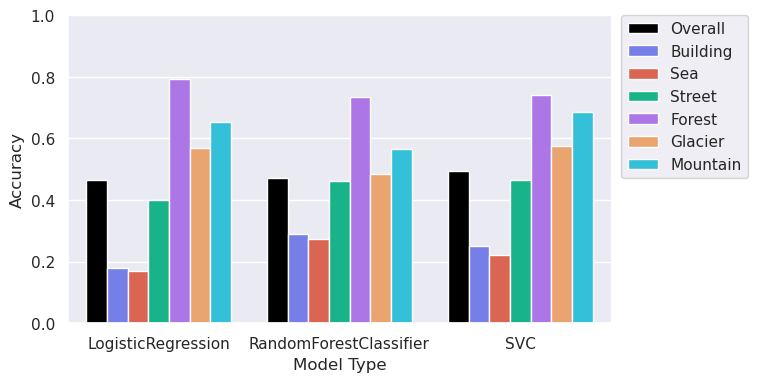

In [22]:
sns.set(rc = {'figure.figsize':(7,4)})
sns.barplot(data=df_UMAP_models, x="Model Type", y="Accuracy", hue="Image Class", palette = ["#000000"] + c_palette)
sns.despine()
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.ylim(0, 1)

While the overall accuracy isn't particularly different between the different classifiers, the SVM accuracy across all image classes is more balanced. 

#### TSNE

Generate a 2 dimensional TSNE embedding of the image data then plot the embedding.

In [23]:
tsne    = TSNE(n_components=2, 
               perplexity=100, 
               learning_rate=20, 
               n_neighbors = 30,
               n_iter = 1000,
               min_grad_norm = 0.0000001,
               exaggeration_iter = 500,
               square_distances = True,
               metric = 'euclidean',
               late_exaggeration = 10,
               method = 'exact',
               random_state = 9)
embedding = tsne.fit_transform(all_images_cupy)

[W] [16:52:02.206243] Perplexity should be within ranges (5, 50). Your results might be a bit strange...
[W] [16:52:02.206280] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


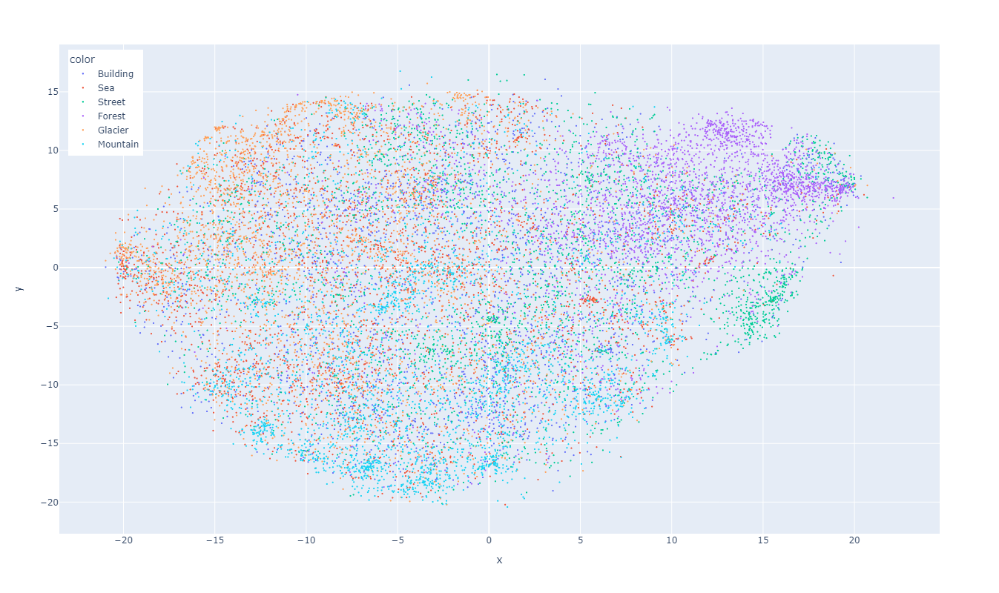

In [24]:
fig = px.scatter(df, x=np.float32(embedding[:,0].get()), y=np.float32(embedding[:,1].get()), color=label_array, width=1000, height=800)
fig.update_traces(marker_size = 2.5)

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

fig.show()

In [25]:
pio.write_html(fig, file = 'TSNE', auto_open=True)  # Write the file to HTML to upload onto webpage.
tsne = None # Clean up TSNE transformer from memory.
cp._default_memory_pool.free_all_blocks()

Generate a mesh grid for the TSNE embedding.

In [26]:
X_train, X_test, y_train, y_test = train_test_split(embedding, cp.asarray(labels, dtype = 'int8'), train_size=0.8)
all_TSNE_models = []

/tmp/ipykernel_78062/3427700711.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator



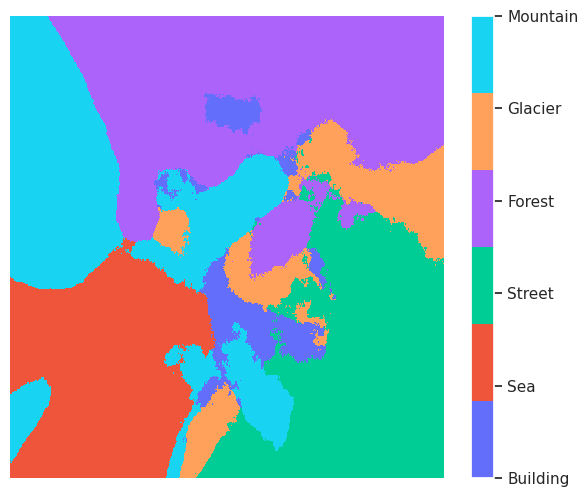

In [27]:
knn = KNeighborsClassifier(n_neighbors=200)
knn.fit(X_train, y_train)
all_TSNE_models.append(((type(knn).__name__, model_test(knn, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))
colormap2D(knn, embedding)

In [28]:
# Clean memory for next step. 
knn = None
cp._default_memory_pool.free_all_blocks()

[W] [16:54:38.961699] L-BFGS line search failed (code 3); stopping at the last valid step


/tmp/ipykernel_78062/3427700711.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator



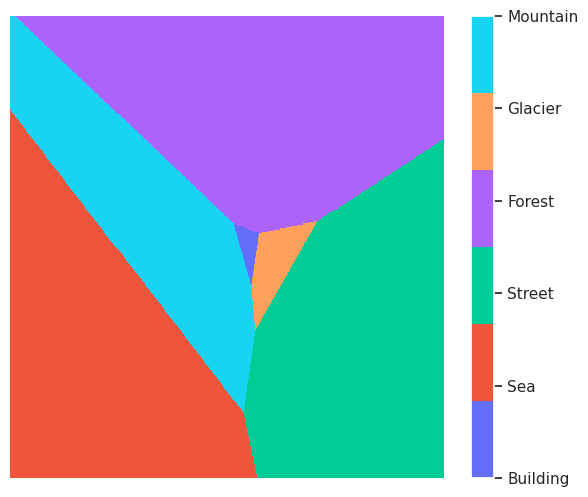

In [29]:
# Train logistic regression classifier then predict on test set. 
reg = LogisticRegression(output_type= 'cupy')
reg.fit(X_train, y_train)
all_TSNE_models.append(((type(reg).__name__, model_test(reg, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))
colormap2D(reg, embedding)

In [30]:
# Clean memory for next step. 
reg = None
cp._default_memory_pool.free_all_blocks()

/tmp/ipykernel_78062/3427700711.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator



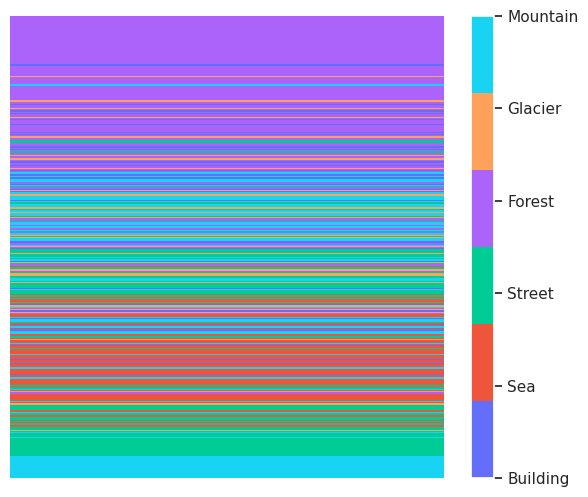

In [31]:
# Train random forest classifier then predict on test set. 
rfr = cuRFC(n_estimators = 1000, split_criterion = 'entropy', bootstrap = True, max_depth = 64, n_bins = 1024)
rfr.fit(X_train, y_train)
all_TSNE_models.append(((type(rfr).__name__, model_test(rfr, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))
colormap2D(rfr, embedding)

In [32]:
# Clean memory for next step. 
rfr = None
cp._default_memory_pool.free_all_blocks()

/tmp/ipykernel_78062/3427700711.py:23: UserWarning:

FixedFormatter should only be used together with FixedLocator



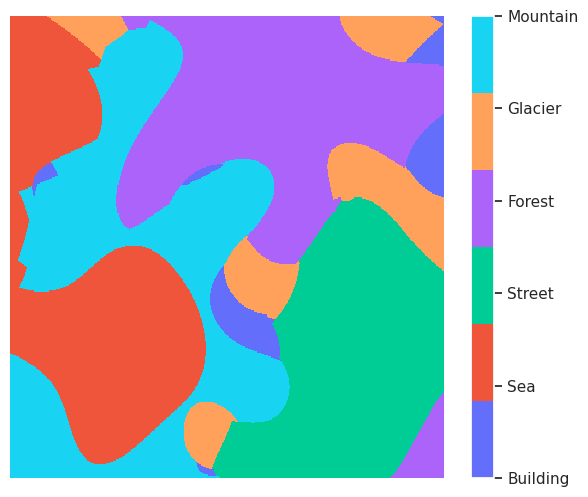

In [33]:
# Train SVM classifier then predict on test set. 
clf = SVC(kernel='rbf', degree=6, gamma='scale', C=100, cache_size = 8192, multiclass_strategy = 'ovo')
clf.fit(X_train, y_train)
all_TSNE_models.append(((type(clf).__name__, model_test(clf, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))
colormap2D(clf, embedding)

In [34]:
# Clean memory for next step. 
clf = None
cp._default_memory_pool.free_all_blocks()

In [35]:
# Manipulating list of classification reuslts into a format that can be read by seaborn barplot.
df_TSNE_models = pd.DataFrame(all_TSNE_models, columns= ["Model Type", "Images"]).explode("Images").reset_index().drop(columns = ['index'])
df_TSNE_models[['Image Class','Accuracy']] = pd.DataFrame(df_TSNE_models.Images.tolist(), index= df_TSNE_models.index)
df_TSNE_models.drop(columns = ["Images"], inplace = True)
df_TSNE_models['Accuracy'] = df_TSNE_models['Accuracy'].astype('float32')

(0.0, 1.0)

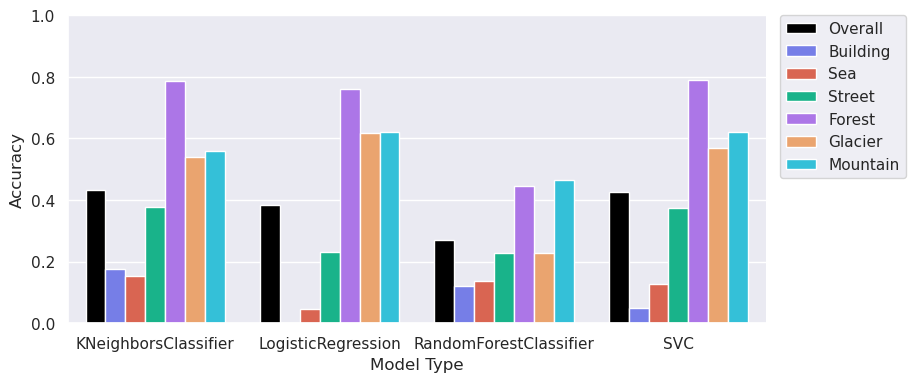

In [36]:
sns.set(rc = {'figure.figsize':(9,4)})
sns.barplot(data=df_TSNE_models, x="Model Type", y="Accuracy", hue="Image Class", palette = ["#000000"] + c_palette)
sns.despine()

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.ylim(0, 1)

#### PCA

In [37]:
all_images_cupy_f32 = all_images_cupy.astype(dtype="float32") #PCA only works with float32 datatypes.
all_images_cupy = None

cp._default_memory_pool.free_all_blocks()

Compute the first 1698 principal components.

In [38]:
PCA_float = IncrementalPCA(n_components = int(all_images_cupy_f32.shape[0]/10), batch_size = int(all_images_cupy_f32.shape[0]/10))
embedding = PCA_float.fit_transform(all_images_cupy_f32)

Turn the individual PCAs into a cumulative sum.

In [39]:
cumulative_PCA_variance = np.cumsum(PCA_float.explained_variance_ratio_.get())

Text(0, 0.5, 'Ratio of Explained Variance')

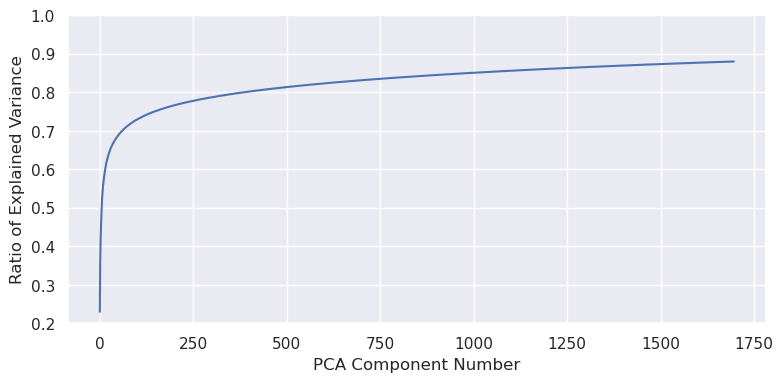

In [40]:
plt.plot(cumulative_PCA_variance)
plt.ylim([0.2, 1])
plt.xlabel("PCA Component Number")
plt.ylabel("Ratio of Explained Variance")

Text(0, 0.5, 'Ratio of Explained Variance')

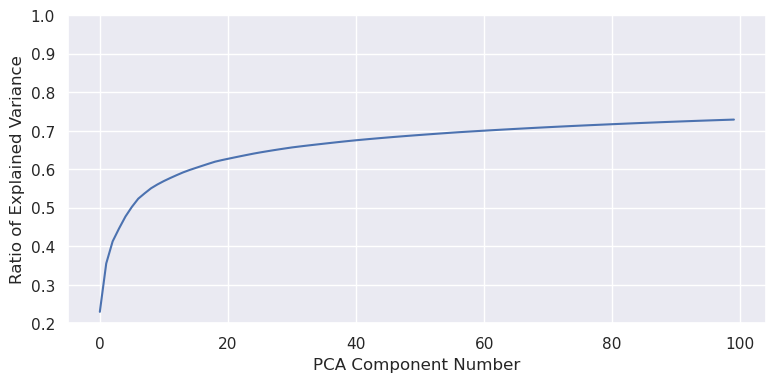

In [41]:
plt.plot(cumulative_PCA_variance[:100])
plt.ylim([0.2, 1])
plt.xlabel("PCA Component Number")
plt.ylabel("Ratio of Explained Variance")

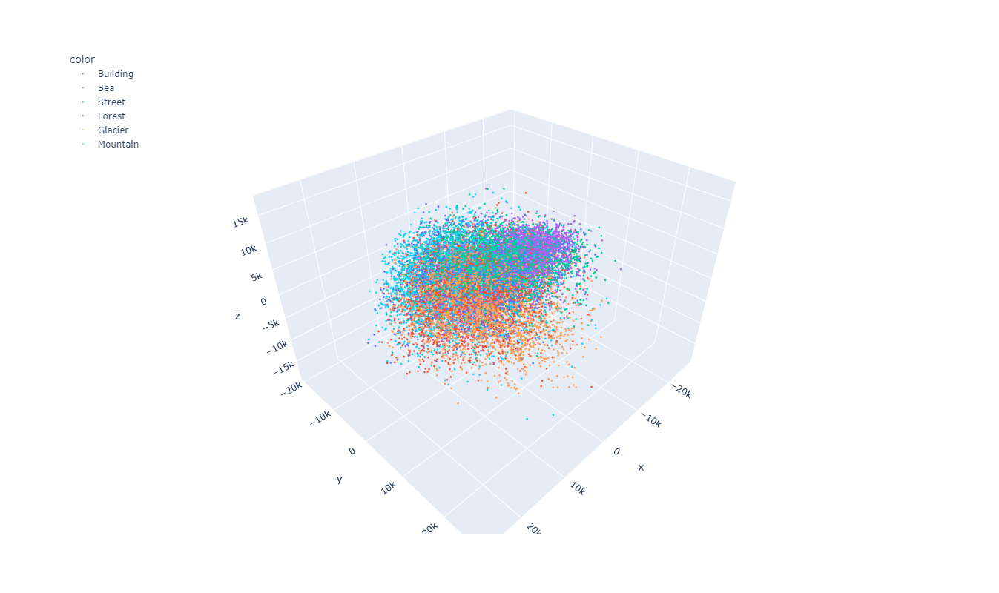

<Figure size 1200x1200 with 0 Axes>

In [42]:
#| fig-cap: 
#|   - "3D scatterplot of UMAP embeddings coloured by HDBSCAN cluster label."
plt.figure(figsize=(12,12))
fig = px.scatter_3d(df, x=np.float32(embedding[:,0].get()), y=np.float32(embedding[:,1].get()), z=np.float32(embedding[:,2].get()), color=label_array, width=1000, height=800)
fig.update_traces(marker_size = 1.5)

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

fig.show()

In [43]:
pio.write_html(fig, file = 'PCA', auto_open=True)
PCA_float = None
cp._default_memory_pool.free_all_blocks()

In [44]:
X_train, X_test, y_train, y_test = train_test_split(embedding[:,:10], cp.asarray(labels, dtype = 'int8'), train_size=0.8)
all_PCA_models = []

In [45]:
# Train logistic regression classifier then predict on test set. 
reg = LogisticRegression(output_type= 'cupy')
reg.fit(X_train, y_train)
all_PCA_models.append(((type(reg).__name__, model_test(reg, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))

In [46]:
# Clean memory for next step. 
reg = None
cp._default_memory_pool.free_all_blocks()

In [47]:
# Train random forest classifier then predict on test set. 
rfr = cuRFC(n_estimators = 1000, split_criterion = 'gini', bootstrap = True, max_depth = 128, n_bins = 256)
rfr.fit(X_train, y_train)
all_PCA_models.append(((type(rfr).__name__, model_test(rfr, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))

/home/ykinakin/miniforge3/envs/rapids-22.10/lib/python3.9/site-packages/cuml/internals/api_decorators.py:567: UserWarning:

To use pickling first train using float32 data to fit the estimator



In [48]:
# Clean memory for next step. 
rfr = None
cp._default_memory_pool.free_all_blocks()

In [49]:
# Train SVM classifier then predict on test set. 
clf = SVC(kernel='rbf', degree=6, gamma='scale', C=100, cache_size = 8192, multiclass_strategy = 'ovo')
clf.fit(X_train, y_train)
all_PCA_models.append(((type(clf).__name__, model_test(clf, X_test, y_test, ordered_names, inv_names_dict, print_output = False))))

In [50]:
# Clean memory for next step. 
clf = None
cp._default_memory_pool.free_all_blocks()

In [51]:
# Manipulating list of classification reuslts into a format that can be read by seaborn barplot.
df_PCA_models = pd.DataFrame(all_PCA_models, columns= ["Model Type", "Images"]).explode("Images").reset_index().drop(columns = ['index'])
df_PCA_models[['Image Class','Accuracy']] = pd.DataFrame(df_PCA_models.Images.tolist(), index= df_PCA_models.index)
df_PCA_models.drop(columns = ["Images"], inplace = True)
df_PCA_models['Accuracy'] = df_PCA_models['Accuracy'].astype('float32')

(0.0, 1.0)

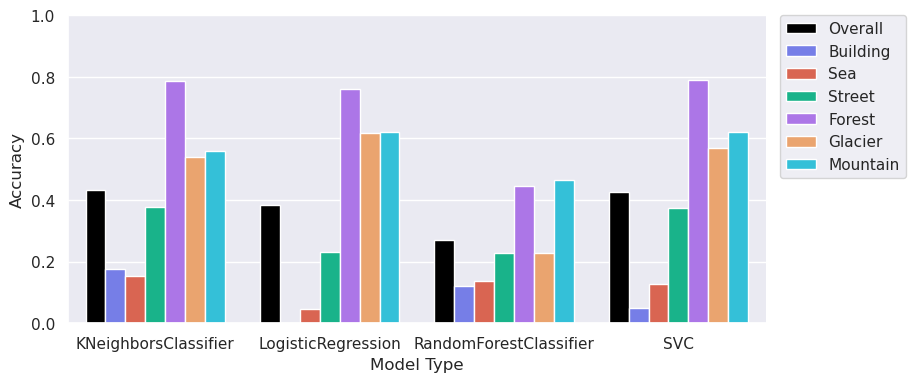

In [52]:
sns.set(rc = {'figure.figsize':(9,4)})
sns.barplot(data=df_TSNE_models, x="Model Type", y="Accuracy", hue="Image Class", palette = ["#000000"] + c_palette)
sns.despine()

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.ylim(0, 1)

Next, we'll dropping the building and streets category to see if the predictions can be substantially improved. We'll remove the building and sea images as these were the most difficult to classify and see what accuracy we could potentially obtain from the reduced classifcation problem. 

In [53]:
# Clean up unused items from memory.
X_train = None
X_test = None
y_train = None
y_test = None

embedding = None

all_images_cupy_f32 = None

cp._default_memory_pool.free_all_blocks()

In [54]:
buildings = np.array([0] * len(labels))
seas = np.array([4] * len(labels))

build_filt = labels != buildings  
seas_filt = labels != seas
combined_filt = build_filt & seas_filt

filt_labels = list(compress(labels, combined_filt))
filt_images = list(compress(images, combined_filt))

filt_label_strings = [names_dict.get(item) for item in filt_labels]
filt_label_array = np.array(filt_label_strings)

In [55]:
all_images_cupy = cp.array(filt_images, dtype = 'float16')

In [56]:
reducer = cuUMAP(
    n_neighbors=20,
    n_components=10,
    n_epochs=500,
    min_dist=0.01,
    random_state = 9
)
embedding = reducer.fit_transform(all_images_cupy)

In [57]:
X_train, X_test, y_train, y_test = train_test_split(embedding, cp.asarray(filt_labels, dtype = 'int8'), train_size=0.8)

In [58]:
clf = SVC(kernel='rbf', degree=6, gamma='scale', C=100, cache_size = 8192, multiclass_strategy = 'ovo')
clf.fit(X_train, y_train)
reduced_UMAP_model = []
reduced_UMAP_model.append(((type(clf).__name__, model_test(clf, X_test, y_test, ordered_names[2:6], inv_names_dict, print_output = True))))

Overall prediction accuracy for SVC = 0.6980561555075594
SVC prediction accuracy for Street images only = 0.6055363321799307
SVC prediction accuracy for Forest images only = 0.7889087656529516
SVC prediction accuracy for Glacier images only = 0.6863799283154122
SVC prediction accuracy for Mountain images only = 0.7129032258064516


### F. Conclusions Drawn as a Result of the Baseline Experiments

**Clearly, the baseline logistic approach shows a remarkably higher accracy vs. CNN's (0.9683 after 100 epochs vs 0.17.  As a note, Logistic's 100 epochs processed much faster than CNN's 2.  Again the accuracy of CNN at 2 epochs is the same as in 10.  So, we could imagine that the result wouldn't be that different at 100 epochs).**

**The next steps here are to experiment on CNN but using CNN/Conv1 using grayscale and to do more hyperparameter tuning.**